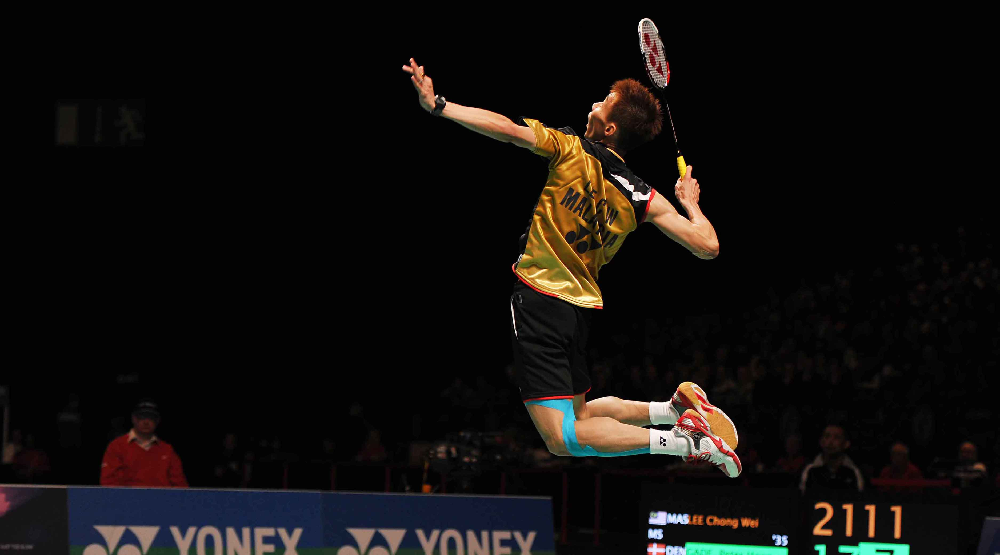

In [56]:
# importing required modules
from PIL import Image
from IPython.display import display 
from matplotlib.image import imread
import numpy as np
import os

# RGB image
file_name = "Images/smash.jpg"
# dispaly image
img = Image.open(file_name)
display(img)

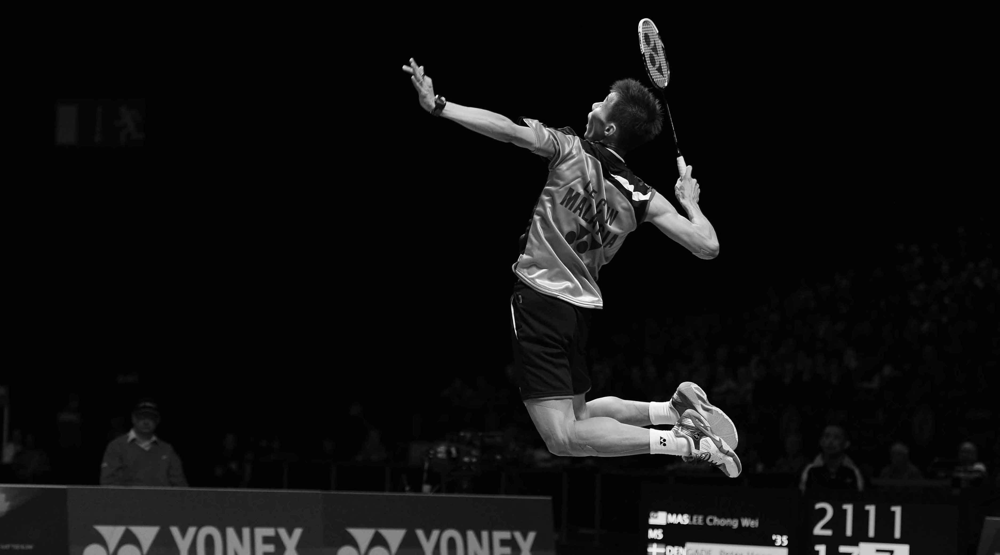

In [57]:
# convert RGB image to Grayscale Image
grayscale_img = img.convert(mode='L')
# display Graysclae image
display(grayscale_img)
# save Graysclae image
grayscale_img.save('Images/grayscale.jpg')

In [58]:
# save pixel values of grayscale image in a matrix
A = imread("Images/grayscale.jpg")
print(A)

[[ 3  3  3 ...  3  3  3]
 [ 3  3  3 ...  3  3  3]
 [ 3  3  3 ...  3  3  3]
 ...
 [21 21 21 ... 80 80 80]
 [21 21 21 ... 84 85 86]
 [21 21 21 ... 84 85 86]]


In [59]:
# compute SVD of the matrix A
U, S, VT = np.linalg.svd(A, full_matrices=False)
S = np.diag(S)
# printing dimensions of U, S and VT
print(f"shape of U: {U.shape}")
print(f"shape of S: {S.shape}")
print(f"shape of VT: {VT.shape}")

shape of U: (2082, 2082)
shape of S: (2082, 2082)
shape of VT: (2082, 3750)


In [60]:
# list of mode values
R = [10, 50, 100, 200, 500, 800, 1000]

for r in R:
    # Reconstruct image matrix
    A_approx = U[:, :r] @ S[0:r, :r] @ VT[:r, :]
    # Convert the pixels into numpy array
    pixel_array = np.array(A_approx, dtype=np.uint8)
    # Create compressed image from array of pixels
    compressed_image = Image.fromarray(pixel_array)
    compressed_image.save(f"Images/{r}_compressed_image_r.jpg")

No of modes = 1000


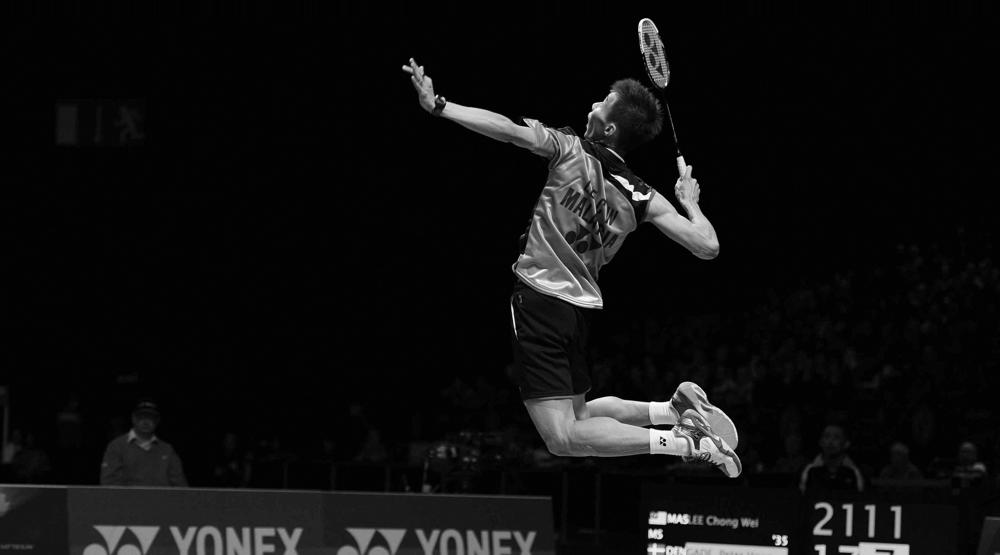

No of modes = 100


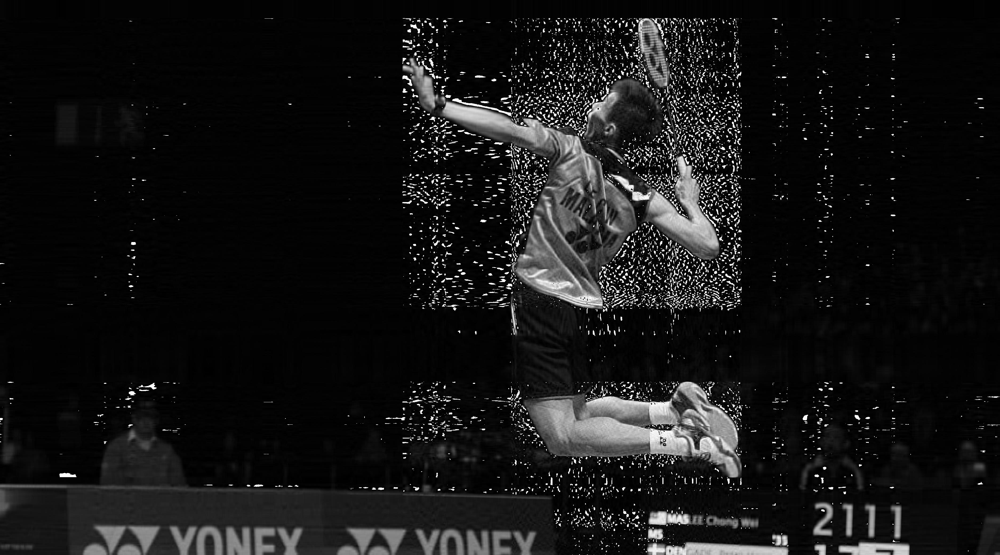

No of modes = 10


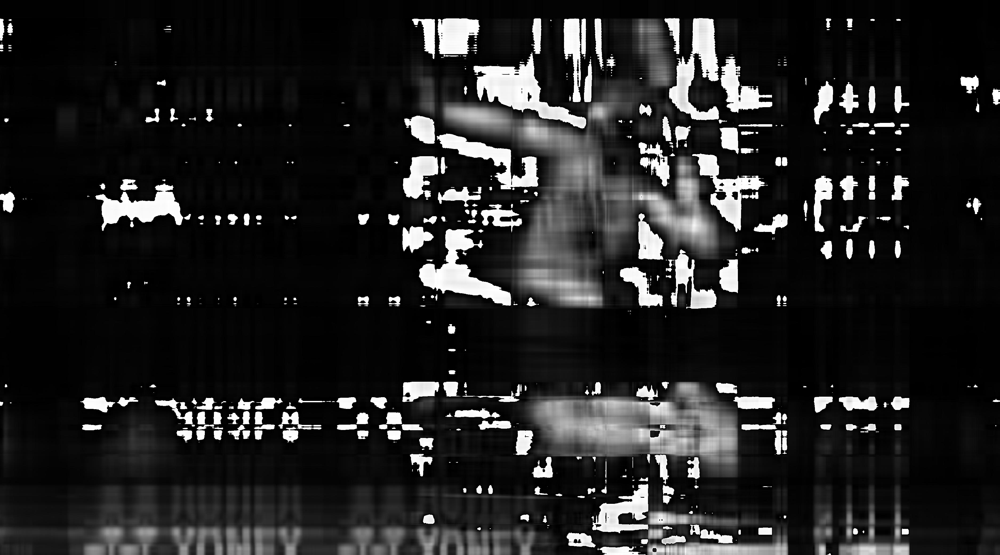

No of modes = 200


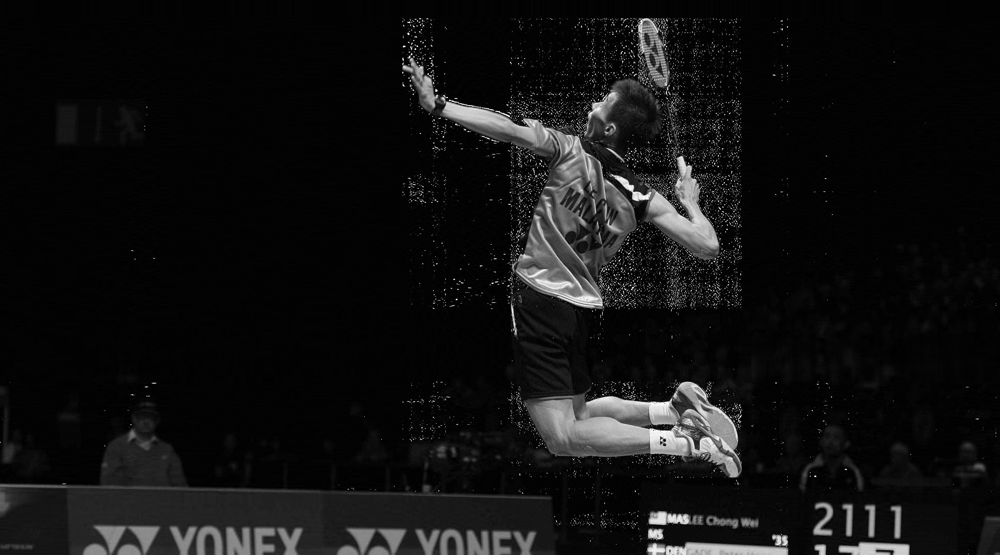

No of modes = 500


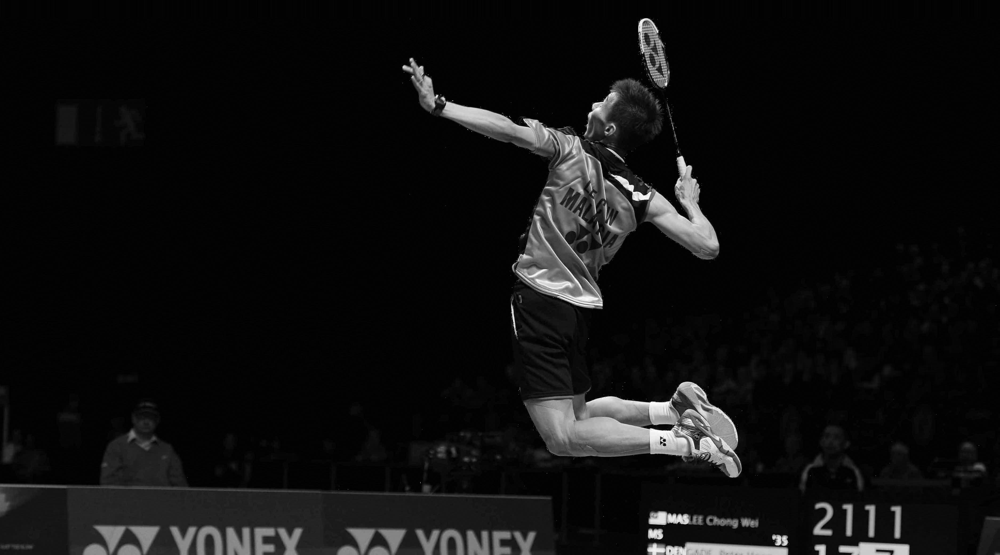

No of modes = 50


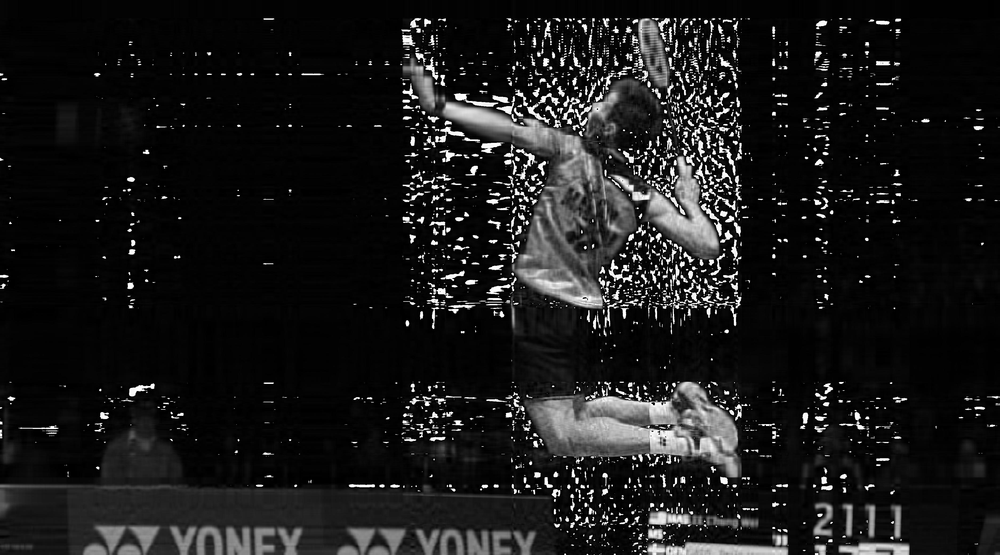

No of modes = 800


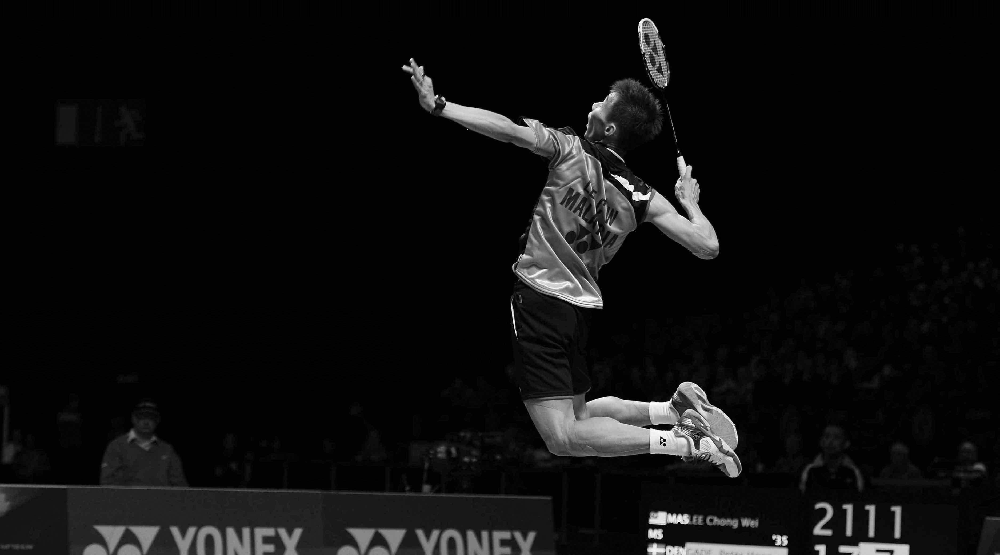

In [63]:
# Display all compressed images
for image in os.listdir('./Images'):
    if image.endswith('_r.jpg'):
        r = image[:image.find('_')]
        print(f"No of modes = {r}")
        img = Image.open('./Images/'+image)
        display(img)